<a href="https://colab.research.google.com/github/friedelj/AAI-510-TEAM-03/blob/main/JFriedel_CV_Assignment4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import imutils
#Start with uploading the required images on Google drive
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
import os

In [3]:
# Define a function to display images with Matplotlib as an alternative to cv2_imshow
def cv2_imshow(image):
    # Convert the color from BGR to RGB if the image is in BGR (OpenCV's default)
    if len(image.shape) == 3 and image.shape[2] == 3:  # Check for color images
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [4]:
try:
    from google.colab.patches import cv2_imshow
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
except ModuleNotFoundError:
    # Define alternatives or mock functions if needed
    def cv2_imshow(image):
        plt.imshow(image)
        plt.show()

    print("Running outside of Google Colab. Using alternative functions for display.")

<Axes: >

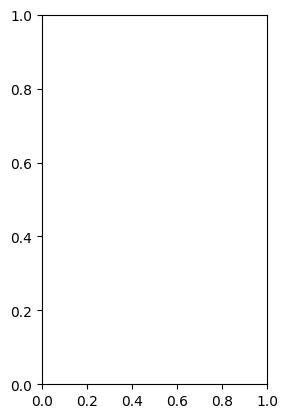

In [5]:
# Read the original image pic1 and create a regular plus a gray version of it.
# The result should be similar to what you see in instrcutions
f = plt.figure()
f.add_subplot(1, 2, 1)

In [6]:
# Load the original image
image = cv2.imread('C:/Users/josep/Assignment4_pic1.jpg')

In [7]:
import cv2

file_path = "/content/Assignment4_pic1.jpg"
image = cv2.imread(file_path)

if image is not None:
    print("Image loaded successfully.")
else:
    print("Failed to load the image.")

Image loaded successfully.


In [8]:
# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [9]:
# Display the original and grayscale images
plt.figure(figsize=(10, 5))

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

(-0.5, 1023.5, 1023.5, -0.5)

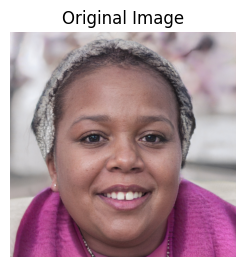

In [10]:
# Display original image (OpenCV loads images in BGR format, so convert to RGB for correct colors)
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

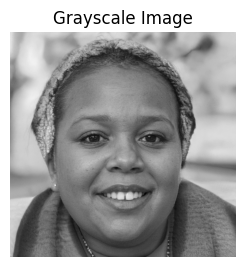

In [11]:
# Display grayscale image
plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')

plt.show()

In [12]:
#a- SIFT
sift = cv2.xfeatures2d.SIFT_create()

In [22]:
# Read the image (adjust the path to image)
img_rgb = cv2.imread("/content/Assignment4_pic1.jpg")

In [21]:
# Convert to grayscale for SIFT processing
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

In [23]:
# Create the SIFT detector
sift = cv2.SIFT_create()

In [24]:
# Detect keypoints and descriptors
original_keypoints, original_descriptor = sift.detectAndCompute(img_gray, None)

In [25]:
# Create a copy of the original image to draw keypoints
keypoints_with_size = np.copy(img_rgb)  # Can be used for visualization with keypoint sizes
keypoints_without_size = np.copy(img_rgb)  # Can be used for visualization without keypoint sizes

In [34]:
# Draw the keypoints (with size)
result1 = cv2.drawKeypoints(img_rgb, original_keypoints, keypoints_with_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
result2 = cv2.drawKeypoints(img_rgb, original_keypoints,keypoints_without_size, color = (0, 255, 0))

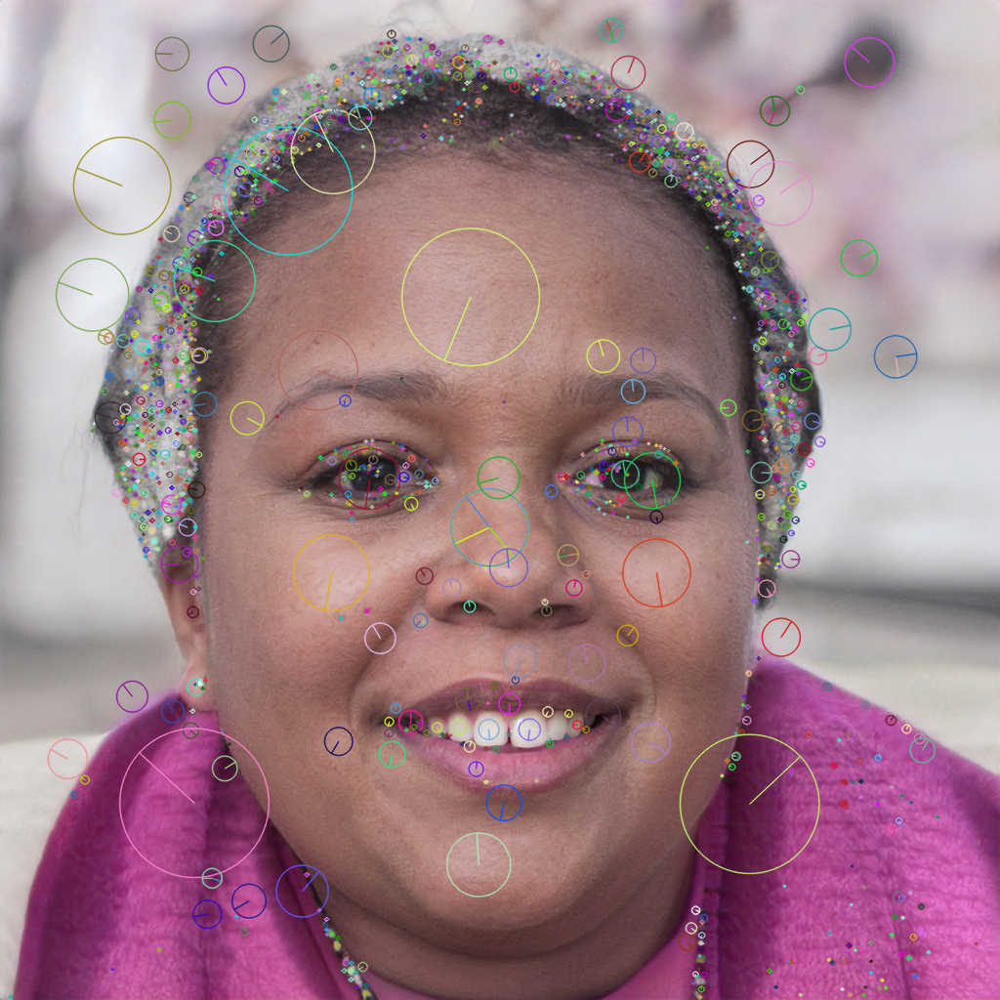

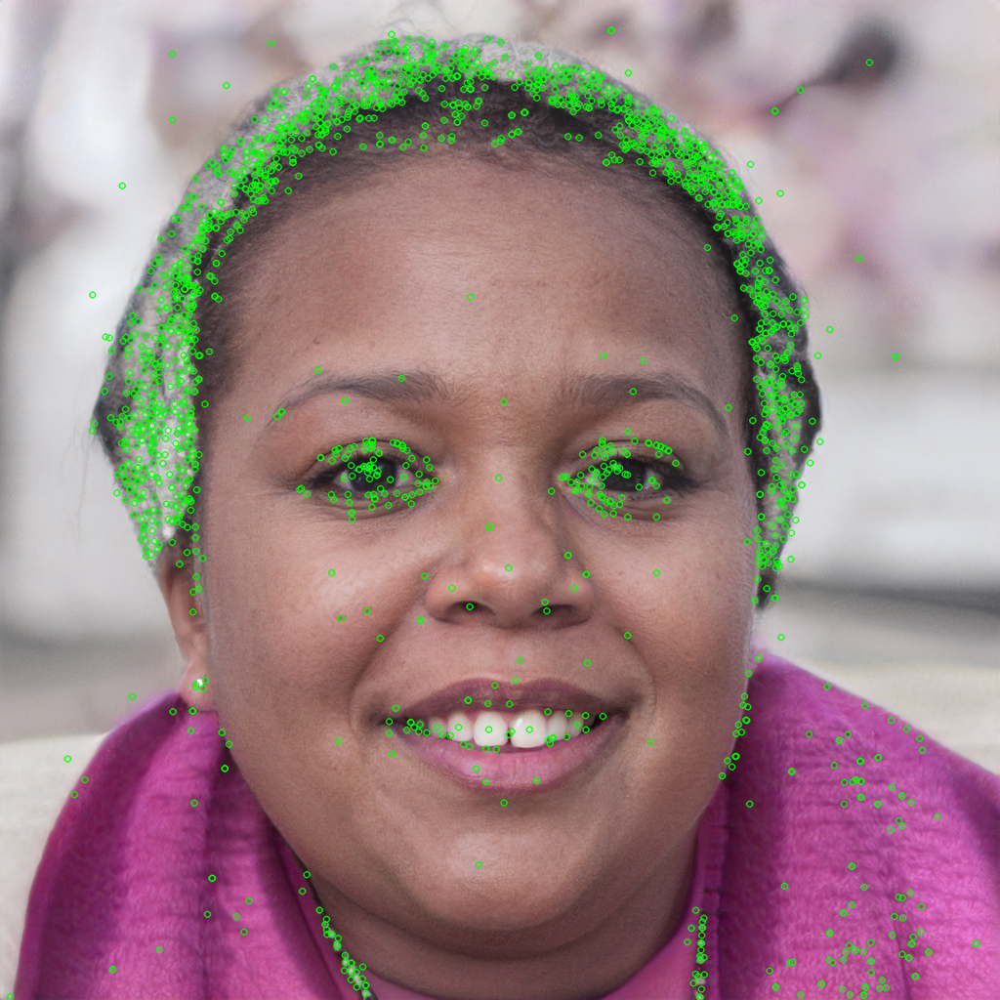

In [36]:
# Display the results in Colab
cv2_imshow(result1)  # Display keypoints with size
cv2_imshow(result2)  # Display keypoints without size

# Wait until a key is pressed (not necessary in Colab)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Explain your understanding here
The top image with different colored and sized circles, highlight the features of the image with the circle size corresponding to the feature size.  The line within the feature shows the direction or orientation of the feature. The cirle coloring corresponds to the OpenCV drawing method used.
The bottom image with small circles show the same features but without scale or orientation information.  It contains less information than the top image, but does a better job of highlighting the image features.

In [37]:
# b- FAST
fast = cv2.FastFeatureDetector_create()

In [39]:
# Detect keypoints without non-maxima suppression
keypoints_with_nonmax = fast.detect(img_gray, None)

In [40]:
# Disable non-maxima suppression
fast.setNonmaxSuppression(False)

In [41]:
# Detect keypoints with non-maxima suppression turned off
keypoints_without_nonmax = fast.detect(img_gray, None)

In [42]:
# Create copies of the original image to draw the results
image_with_nonmax = np.copy(img_rgb)
image_without_nonmax = np.copy(img_rgb)

In [43]:
# Draw the keypoints on the images
cv2.drawKeypoints(img_rgb, keypoints_with_nonmax, image_with_nonmax, color=(0, 255, 0), flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(img_rgb, keypoints_without_nonmax, image_without_nonmax, color=(0, 0, 255), flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

array([[[209, 200, 203],
        [227, 218, 221],
        [232, 221, 229],
        ...,
        [220, 210, 226],
        [218, 206, 224],
        [205, 191, 209]],

       [[228, 219, 222],
        [228, 219, 222],
        [230, 220, 226],
        ...,
        [213, 206, 221],
        [219, 207, 225],
        [217, 203, 221]],

       [[232, 225, 228],
        [230, 223, 226],
        [230, 223, 228],
        ...,
        [216, 209, 222],
        [221, 210, 226],
        [220, 209, 225]],

       ...,

       [[166, 172, 183],
        [178, 185, 194],
        [174, 179, 188],
        ...,
        [165,  90, 198],
        [162,  93, 196],
        [164,  99, 198]],

       [[151, 155, 166],
        [170, 175, 184],
        [167, 172, 181],
        ...,
        [154,  88, 190],
        [154,  93, 189],
        [155,  98, 189]],

       [[141, 145, 156],
        [157, 162, 171],
        [155, 160, 169],
        ...,
        [160,  96, 196],
        [163, 106, 197],
        [160, 107, 194]]

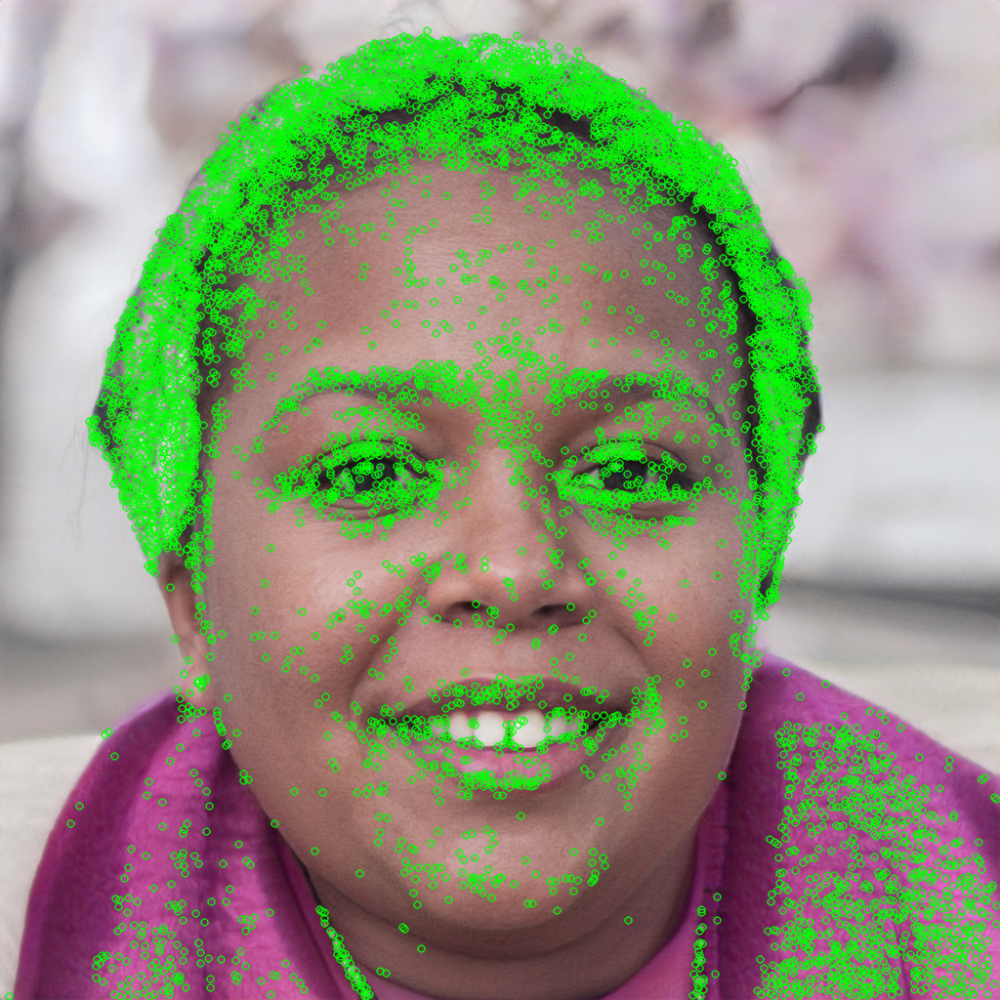

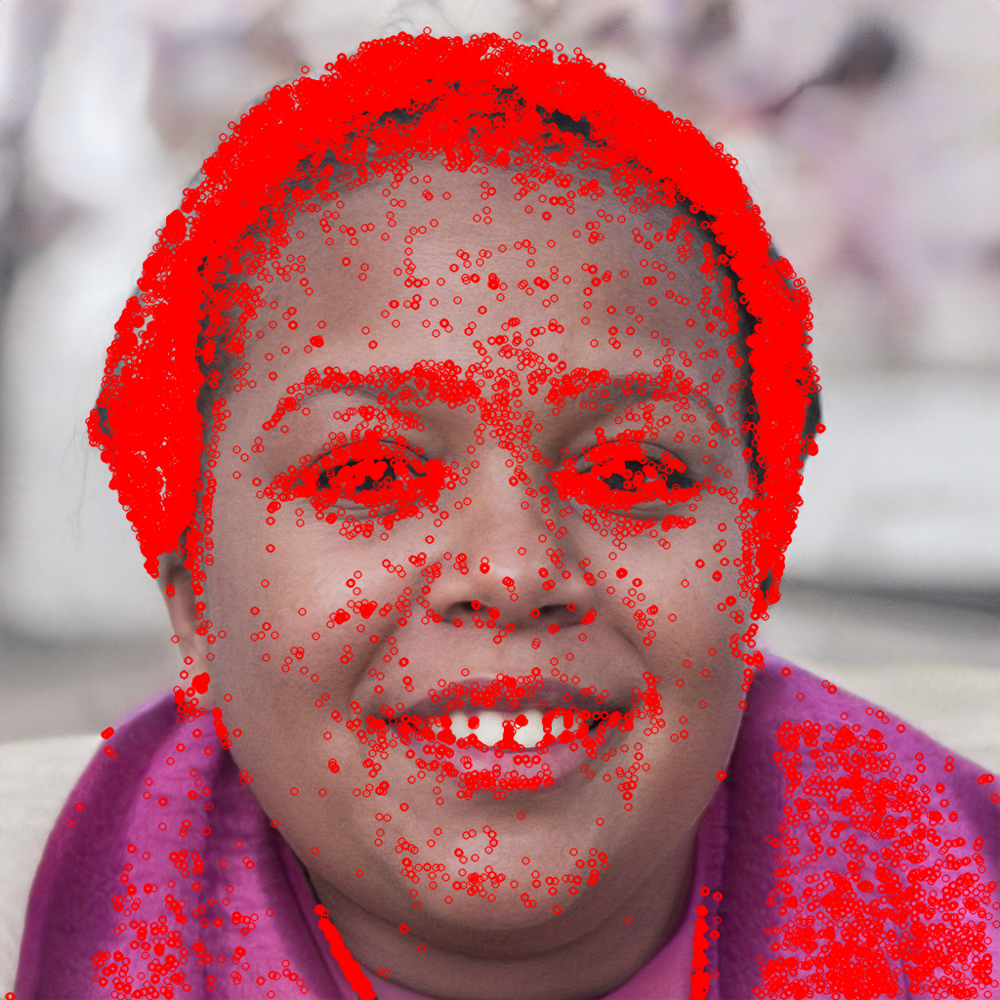

In [45]:
# Show the results using cv2_imshow
cv2_imshow(image_with_nonmax)
cv2_imshow(image_without_nonmax)

# Explain your understanding here:
The top image with green circles show key features detected by non-maxima suppression.  Non-maxima suppression only keeps the strongest keypoits in a region.
The bottom image with red circles does not apply non-maxima suppression.  All keypoints are retained.  With fewer circcles, the image features may be clearer in the top image, using non-maxima supression.

# c- ORB

In [47]:
# ORB Detector (ORB integrates FAST and BRIEF)
orb = cv2.ORB_create()

In [48]:
# Detect keypoints and descriptors using ORB
keypoints, descriptors = orb.detectAndCompute(img_gray, None)

In [49]:
# Draw keypoints with size and orientation
result1 = cv2.drawKeypoints(
    img_rgb,
    keypoints,
    keypoints_with_size,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

In [ ]:
# Draw keypoints without size
result2 = cv2.drawKeypoints(
    img_rgb,
    keypoints,
    keypoints_without_size,
    color=(0, 255, 0)
)

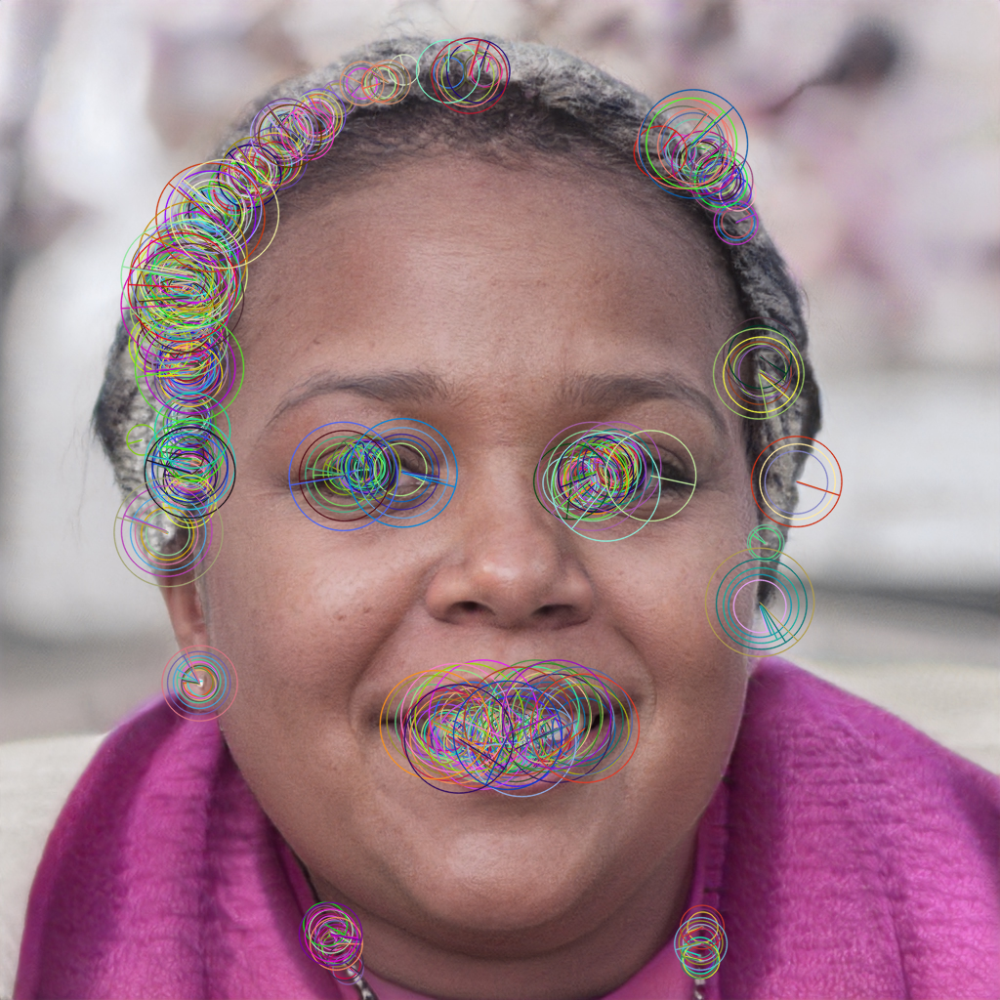

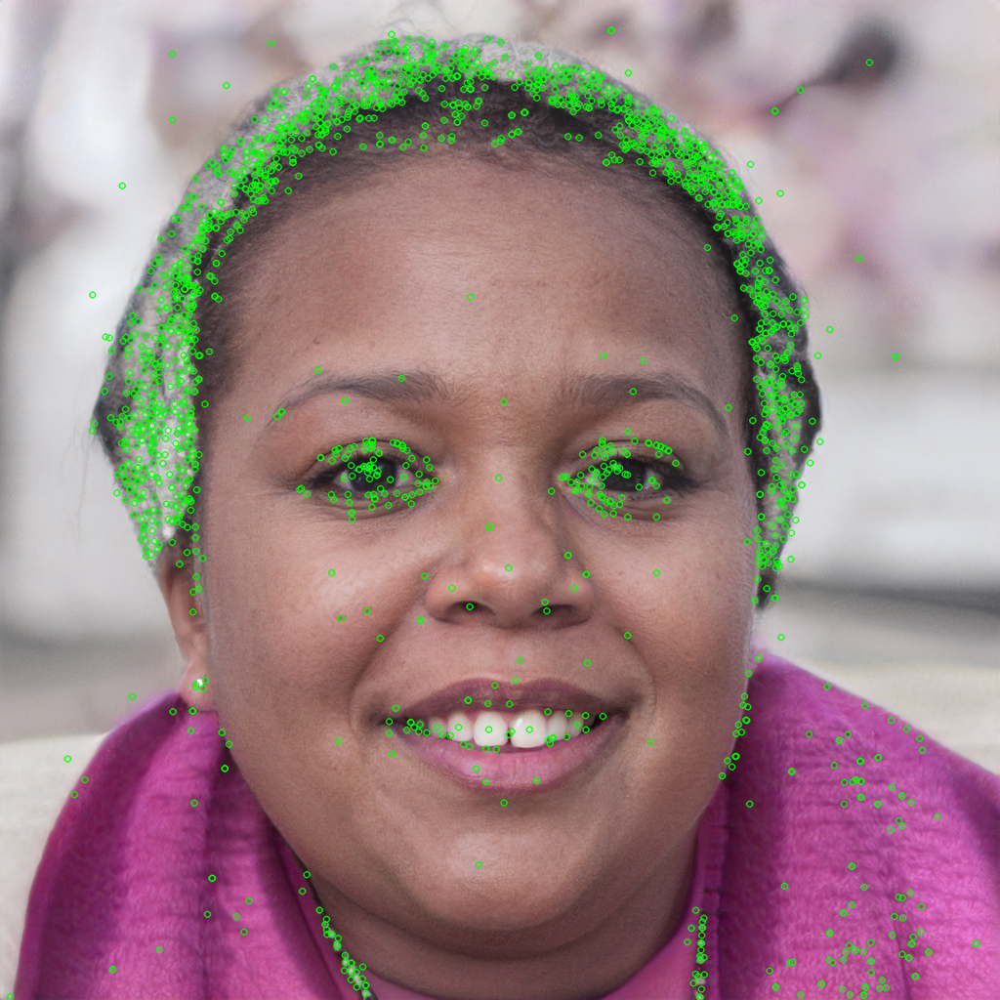

In [50]:
# Display the results
cv2_imshow(result1)  # Keypoints with size and orientation
cv2_imshow(result2)  # Keypoints without size

# Explain your understanding here:
The top image, with multi-colored circles show image features, along with size and orientation information.  Larger circles indicate larger features.  The cirlces show the most important and stable features.
The green-circle image show found-features highlighted by the green circles.  It does not have the relative-size and orientation information of the top image, making easier to understand.

#d- Finding the matching points

In [54]:
# Load the two images
image1 = cv2.imread('/content/Assignment4_pic1.jpg')
image2 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

In [56]:
# Convert both images to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = image2

In [57]:
# Initialize ORB detector
orb = cv2.ORB_create()

In [58]:
keypoints1, descriptors1 = orb.detectAndCompute(gray1, None)
keypoints2, descriptors2 = orb.detectAndCompute(gray2, None)

In [59]:
# Initialize Brute-Force Matcher with Hamming distance
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

In [60]:
# Match descriptors
matches = bf.match(descriptors1, descriptors2)

In [61]:
# Sort matches by distance (quality of the match)
matches = sorted(matches, key=lambda x: x.distance)

In [62]:
# Draw matches
result = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

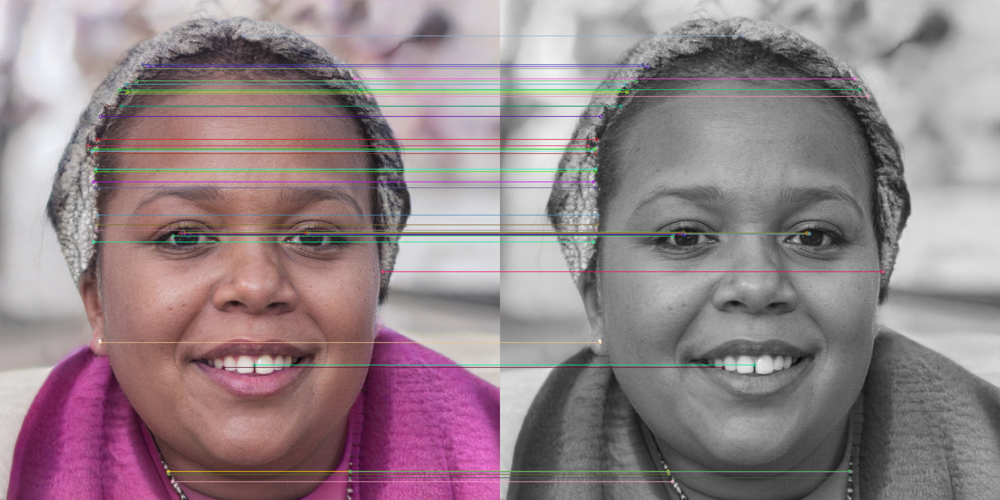

In [63]:
# Display the result
cv2_imshow(result)

In [64]:
# Print the number of matching points
print(f"Number of matching points: {len(matches)}")

Number of matching points: 500


# Explain your understanding here:
I am comparing the color photo of the same image to the gray-scale photo on the left.  Dozens of lines connect the found matching features of the two photos.  I see a small error, where different teeth are matched.  The high number of matching points would be expected in the same photo, but in two different color scales.  I suspect the even number of 500, is the maximum number of matches the matching subroutine allowed.

In [52]:
#d- Finding the matching points
brute_force = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
matches = brute_force.match(original_descriptor, query_descriptor)
matches = sorted(matches, key = lambda x : x.distance)
result = cv2.drawMatches(img_rgb, original_keypoints, img_gray, query_keypoints, matches, img_gray, flags = 2)
plt.imshow(result)
print("The number of matching keypoints between the original and the query image is {}\n".format(len(matches)))

NameError: name 'query_descriptor' is not defined

In [38]:
# Find detect and compute function and apply it on top of fast
keypoints_with_nonmax = fast.detect(#put something here- maybe use above approach)
fast.setNonmaxSuppression(False)
image_with_nonmax = np.copy(img_rgb)

SyntaxError: '(' was never closed (<ipython-input-38-0dbb98091d87>, line 2)